# Collisions Analysis

__March 2022__

This notebook analyses the datasets pulled in the `pull-cycle-streets-data.ipynb` notebook.

The initial aim is to recreate the junctions that have already been identified by LCC as 'dangerous' to see whether we can do this automatically from data:

Current dangerous junctions map - https://lcc.org.uk/campaigns/dangerous-junctions/

In [2]:
import os
import geopandas
import numpy as np
import pandas as pd
import networkx as nx
import contextily as cx
import seaborn as sns
import matplotlib.pyplot as plt

from dotenv import load_dotenv

load_dotenv()
os_api_key = os.getenv('OS_API_KEY')

%config InlineBackend.figure_format = 'retina'

sns.set_palette('Dark2')
plt.rcParams["font.family"] = "Calibri"
plt.rcParams["font.size"] = 12

In [3]:
# not a massive fan of the use of the term 'accidents'
collisions = pd.read_csv('../data/accidents.csv')

# example row
collisions.sample(1).T

,3072
id,200201DM01306
accyr,2002
casualties,Cyclist
accident_year,2002
accident_reference,01DM01306
location_easting_osgr,526590
location_northing_osgr,182420
longitude,-0.17657
latitude,51.526459
police_force,Metropolitan Police


Filter to fatal collisions and those at junctions

In [4]:
print(collisions.accident_severity.unique())
print(collisions.junction_detail.unique())

['Serious' 'Fatal']
['Not at junction or within 20 metres' 'Private drive or entrance'
 'T or staggered junction' 'Crossroads' 'Roundabout' 'Other junction'
 'Slip road' 'More than 4 arms (not roundabout)' 'Mini-roundabout'
 'unknown (self reported)']


In [5]:
junction_collisions = collisions[
    # (collisions['accident_severity'] == 'Fatal') &
    (collisions['junction_detail'] != 'Not at junction or within 20 metres')
]

junction_collisions.head()

,id,accyr,casualties,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,datetime
1,200001WW00551,2000,Cyclist,2000,01WW00551,525840,174770,-0.190102,51.457874,Metropolitan Police,...,Darkness - lights lit,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004514,2000-05-19 23:26:00
3,200401WW00069,2004,Cyclist,2004,01WW00069,526050,175400,-0.186856,51.463490,Metropolitan Police,...,Darkness - lights lit,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004509,2004-01-27 18:57:00
4,200601TE00267,2006,Cyclist,2006,01TE00267,525780,174960,-0.190897,51.459595,Metropolitan Police,...,Daylight,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004509,2006-09-27 06:46:00
5,200601WW50158,2006,Cyclist,2006,01WW50158,525870,174650,-0.189713,51.456789,Metropolitan Police,...,Daylight,Fine no high winds,Dry,None,None,Urban,No,Non-trunk,E01004514,2006-02-27 19:00:00
6,200701WW50144,2007,Cyclist,2007,01WW50144,525810,174920,-0.190480,51.459229,Metropolitan Police,...,Darkness - lights lit,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004509,2007-03-07 18:18:00


### Plot points

No map background for now.

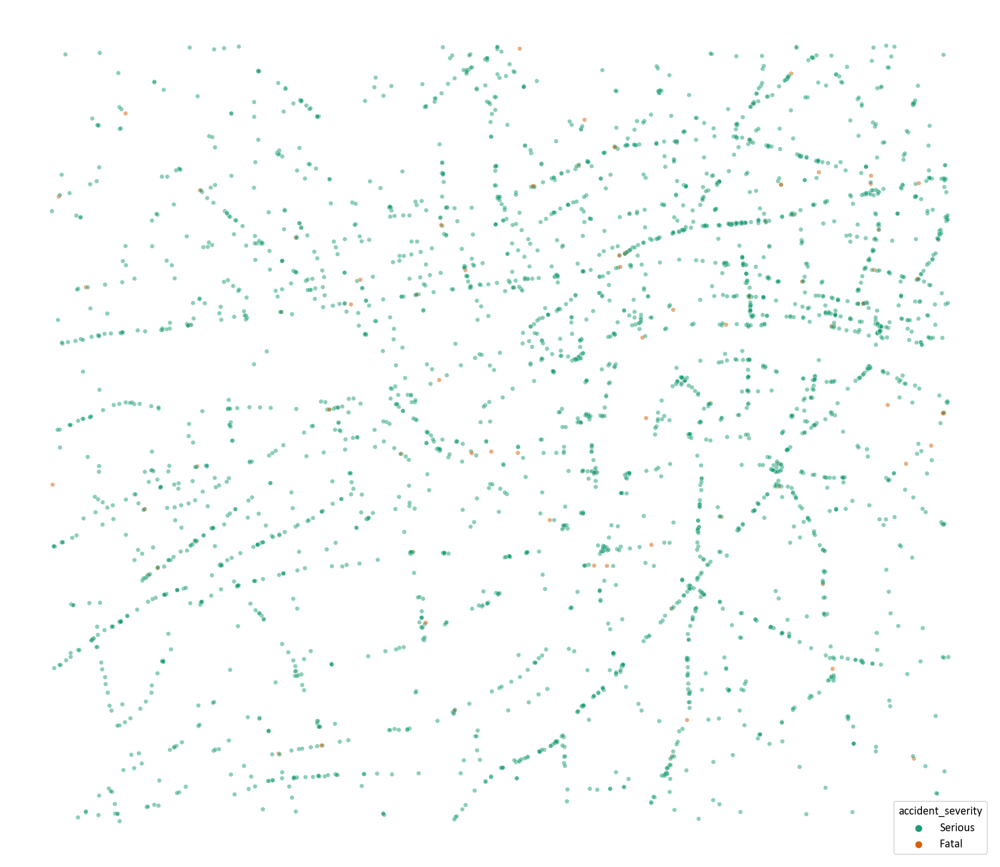

In [6]:
fig, ax = plt.subplots(figsize=(18, 16))
sns.scatterplot(
    data=junction_collisions,
    x='longitude',
    y='latitude',
    hue='accident_severity',
    alpha=.5,
    s=20
);

ax.set_axis_off()

### Convert to Geo Pandas DF

This will allow us to plot maps underneath data etc.

In [162]:
gpd_junction_collisions = geopandas.GeoDataFrame(
    junction_collisions,
    geometry=geopandas.points_from_xy(junction_collisions.longitude, junction_collisions.latitude, crs="EPSG:4326")
)

gpd_junction_collisions.head()

,id,accyr,casualties,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,...,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,datetime,geometry
1,200001WW00551,2000,Cyclist,2000,01WW00551,525840,174770,-0.190102,51.457874,Metropolitan Police,...,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004514,2000-05-19 23:26:00,POINT (-0.19010 51.45787)
3,200401WW00069,2004,Cyclist,2004,01WW00069,526050,175400,-0.186856,51.463490,Metropolitan Police,...,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004509,2004-01-27 18:57:00,POINT (-0.18686 51.46349)
4,200601TE00267,2006,Cyclist,2006,01TE00267,525780,174960,-0.190897,51.459595,Metropolitan Police,...,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004509,2006-09-27 06:46:00,POINT (-0.19090 51.45960)
5,200601WW50158,2006,Cyclist,2006,01WW50158,525870,174650,-0.189713,51.456789,Metropolitan Police,...,Fine no high winds,Dry,None,None,Urban,No,Non-trunk,E01004514,2006-02-27 19:00:00,POINT (-0.18971 51.45679)
6,200701WW50144,2007,Cyclist,2007,01WW50144,525810,174920,-0.190480,51.459229,Metropolitan Police,...,Fine no high winds,Dry,None,None,Urban,Yes,Non-trunk,E01004509,2007-03-07 18:18:00,POINT (-0.19048 51.45923)


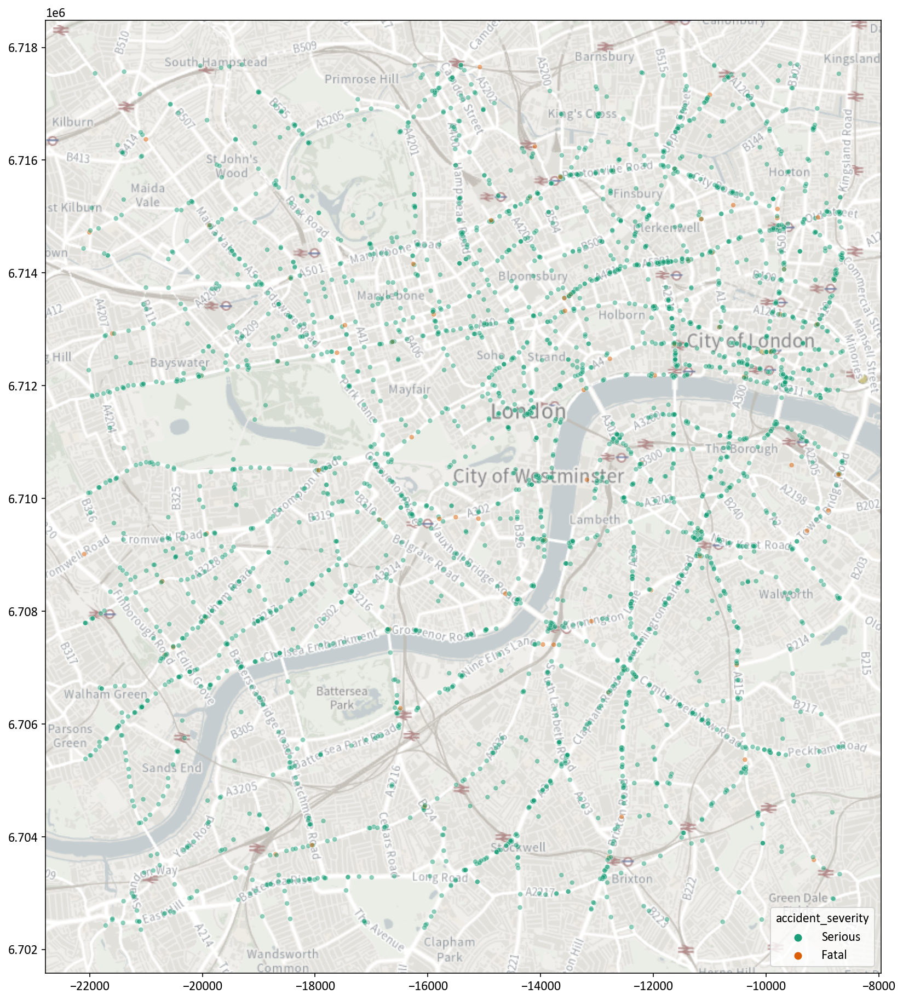

In [163]:
gpd_junction_collisions.to_crs(epsg=3857, inplace=True)

fig, ax = plt.subplots(figsize=(24, 16))

sns.scatterplot(
    x=gpd_junction_collisions.geometry.x,
    y=gpd_junction_collisions.geometry.y,
    hue=gpd_junction_collisions.accident_severity,
    alpha=.5,
    s=20
);
# ax = gpd_junction_collisions.geometry.plot(figsize=(20, 20), alpha=.5, color='blue')

cx.add_basemap(ax, source=r"https://api.os.uk/maps/raster/v1/zxy/Light_3857/{z}/{x}/{y}.png?key=" + os_api_key)

# ax.set_axis_off()

## Clustering

Can we cluster points to identify junctions and then allow us to filter to high collision junctions?

In [202]:
points = junction_collisions[['id', 'longitude', 'latitude', 'accident_severity']].copy()

In [203]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, KMeans

scaler = StandardScaler()

X = points[['longitude', 'latitude']]
X = scaler.fit_transform(X)

# clustering = KMeans(n_clusters=400).fit(X)
clustering = DBSCAN(eps=.03, min_samples=5).fit(X)

points['cluster'] = clustering.labels_.astype(str)

clustering.labels_

array([-1, -1, -1, ..., -1, -1, -1])

In [209]:
points['collision_metric'] = np.where(
    points['accident_severity'] == 'Fatal',
    5,
    1
)

junctions = points[points['cluster'] != '-1'].groupby('cluster')['collision_metric'].sum().reset_index().sort_values(by='collision_metric', ascending=False)
junctions.head(20)

,cluster,collision_metric
149,93,42
15,111,36
10,107,34
84,34,33
153,97,32
130,76,25
27,122,20
121,68,20
144,89,18
14,110,17


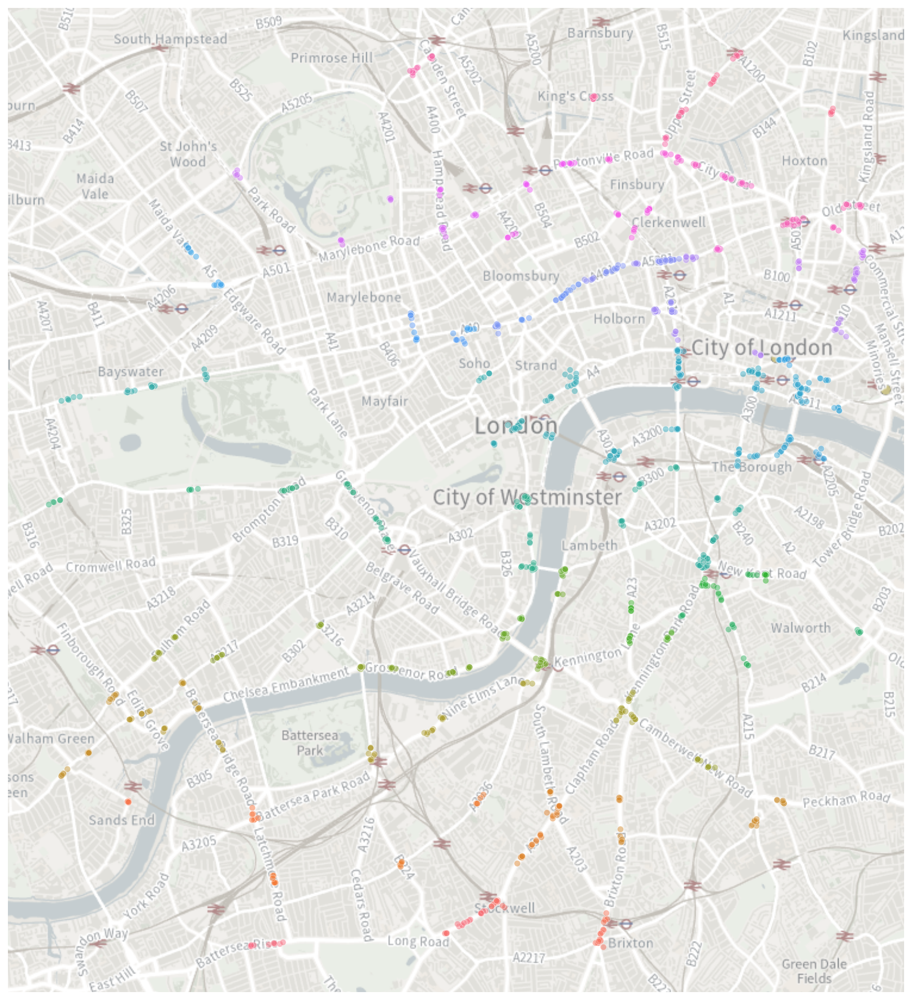

In [217]:
gpd_points = geopandas.GeoDataFrame(
    points,
    geometry=geopandas.points_from_xy(points.longitude, points.latitude, crs="EPSG:4326")
)
gpd_points.to_crs(epsg=3857, inplace=True)

fig, ax = plt.subplots(figsize=(18, 16))

plt_data = gpd_points[gpd_points['cluster'] != '-1']

sns.scatterplot(
    # data=gpd_points[gpd_points['cluster'] != '-1'],
    # data=points[
    #     (points['latitude'] >= 51.49) &
    #     (points['latitude'] <= 51.50) &
    #     (points['longitude'] >= -.11) &
    #     (points['longitude'] <= -.09)
    # ],
    x=plt_data.geometry.x,
    y=plt_data.geometry.y,
    hue=plt_data.cluster,
    alpha=.5,
    s=30,
    legend=False
);

cx.add_basemap(ax, source=r"https://api.os.uk/maps/raster/v1/zxy/Light_3857/{z}/{x}/{y}.png?key=" + os_api_key)

# plt.xlim(-.11, -.09)
# plt.ylim(51.49, 51.50)

ax.set_axis_off()
del plt_data

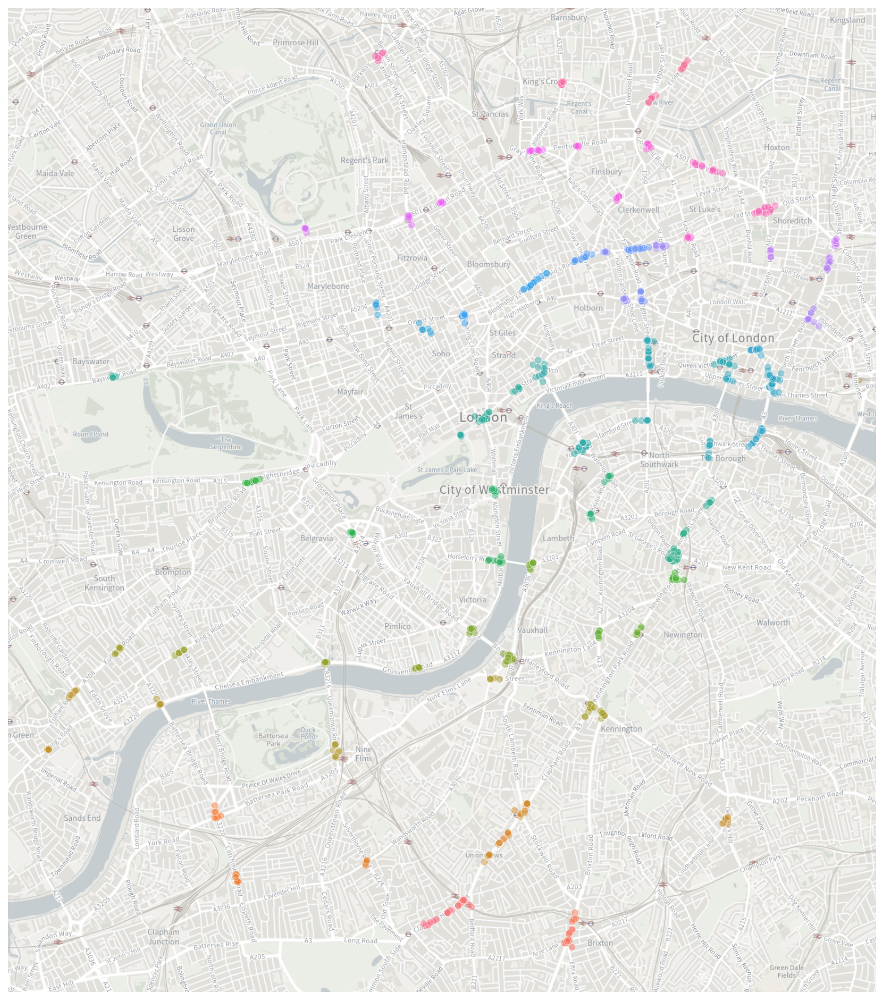

In [219]:
fig, ax = plt.subplots(figsize=(18, 16))

plt_data = gpd_points[gpd_points['cluster'].isin(junctions.head(80).cluster)]

sns.scatterplot(
    # data=gpd_points[gpd_points['cluster'] != '-1'],
    # data=points[
    #     (points['latitude'] >= 51.49) &
    #     (points['latitude'] <= 51.50) &
    #     (points['longitude'] >= -.11) &
    #     (points['longitude'] <= -.09)
    # ],
    x=plt_data.geometry.x,
    y=plt_data.geometry.y,
    hue=plt_data.cluster,
    alpha=.5,
    s=40,
    legend=False
);

cx.add_basemap(ax, source=r"https://api.os.uk/maps/raster/v1/zxy/Light_3857/{z}/{x}/{y}.png?key=" + os_api_key)

# plt.xlim(-.11, -.09)
# plt.ylim(51.49, 51.50)

ax.set_axis_off()
del plt_data

Note we using the assumption that doing euclidean distance between coordinates is a good enough proxy for the real distance. Given the points don't differ greatly in lat/lon values I think this should be ok.

In [84]:
point_combinations = points.assign(key=1).merge(points.assign(key=1), on="key").drop("key", axis=1)

point_combinations = point_combinations[point_combinations['id_x'] != point_combinations['id_y']]

print(len(point_combinations))

# remove far away points
point_combinations = point_combinations[
    (abs(point_combinations['longitude_x'] - point_combinations['longitude_y']) < .01) &
    (abs(point_combinations['latitude_x'] - point_combinations['latitude_y']) < .01)
]

print(len(point_combinations))

# calculate distances of those remaining
point_combinations['dist'] = point_combinations.apply(
    lambda row: np.linalg.norm(row[['longitude_x', 'latitude_x']].values - row[['longitude_y','latitude_y']].values), axis=1
)


point_combinations

9569742
446454


,id_x,longitude_x,latitude_x,cluster_x,id_y,longitude_y,latitude_y,cluster_y,dist
1,200001WW00551,-0.190102,51.457874,116,200401WW00069,-0.186856,51.463490,330,0.006487
2,200001WW00551,-0.190102,51.457874,116,200601TE00267,-0.190897,51.459595,116,0.001896
3,200001WW00551,-0.190102,51.457874,116,200601WW50158,-0.189713,51.456789,331,0.001153
4,200001WW00551,-0.190102,51.457874,116,200701WW50144,-0.190480,51.459229,116,0.001407
5,200001WW00551,-0.190102,51.457874,116,200901WW50259,-0.185796,51.457538,44,0.004319
...,...,...,...,...,...,...,...,...,...
9572830,2020010279483,-0.078230,51.540879,300,2019010176286,-0.082063,51.535816,241,0.006350
9572831,2020010279483,-0.078230,51.540879,300,2019010183792,-0.082353,51.535434,241,0.006830
9572832,2020010279483,-0.078230,51.540879,300,2019010214715,-0.087379,51.533187,373,0.011953
9572833,2020010279483,-0.078230,51.540879,300,2019010224323,-0.087686,51.541672,131,0.009489


In [129]:
point_combinations['dist'] = np.where(
    point_combinations['dist'] == 0,
    .0001,
    point_combinations['dist']
)

point_combinations['weight'] = 1 / point_combinations['dist']

point_combinations.rename(
    columns={
        'id_x': 'source',
        'id_y': 'target',
    },
    inplace=True
)

point_combinations

,source,longitude_x,latitude_x,cluster_x,target,longitude_y,latitude_y,cluster_y,dist,weight
1,200001WW00551,-0.190102,51.457874,116,200401WW00069,-0.186856,51.463490,330,0.006487,154.163983
2,200001WW00551,-0.190102,51.457874,116,200601TE00267,-0.190897,51.459595,116,0.001896,527.495865
3,200001WW00551,-0.190102,51.457874,116,200601WW50158,-0.189713,51.456789,331,0.001153,867.584335
4,200001WW00551,-0.190102,51.457874,116,200701WW50144,-0.190480,51.459229,116,0.001407,710.864928
5,200001WW00551,-0.190102,51.457874,116,200901WW50259,-0.185796,51.457538,44,0.004319,231.530293
...,...,...,...,...,...,...,...,...,...,...
9572830,2020010279483,-0.078230,51.540879,300,2019010176286,-0.082063,51.535816,241,0.006350,157.473758
9572831,2020010279483,-0.078230,51.540879,300,2019010183792,-0.082353,51.535434,241,0.006830,146.415624
9572832,2020010279483,-0.078230,51.540879,300,2019010214715,-0.087379,51.533187,373,0.011953,83.661926
9572833,2020010279483,-0.078230,51.540879,300,2019010224323,-0.087686,51.541672,131,0.009489,105.383039


In [154]:
from networkx.algorithms.community.label_propagation import asyn_lpa_communities

G = nx.from_pandas_edgelist(
    point_combinations[point_combinations['weight'] >= 500],
    source='source',
    target='target',
    edge_attr='weight'
)

communities = asyn_lpa_communities(G, weight='weight', seed=2)

In [155]:
n = 1
all_ids, labels = [], []

for community in communities:
    ids = list(community)

    all_ids.extend(ids)
    labels.extend([n for x in range(len(ids))])

    n += 1
    
community_df = pd.DataFrame({
    'junction_id': labels,
    'collision_id': all_ids
})

community_df['size'] = community_df.groupby('junction_id')['collision_id'].transform('count')
community_df[['junction_id', 'size', 'collision_id']]

community_df

,junction_id,collision_id,size
0,1,2019010192783,5
1,1,200001WW00551,5
2,1,2020010252549,5
3,1,201001WW50030,5
4,1,200601WW50158,5
...,...,...,...
2978,674,2018010111637,3
2979,674,2019010214715,3
2980,674,2017010023329,3
2981,675,2019010224323,2


In [156]:
community_df.junction_id.nunique()

675

In [157]:
p = points.merge(community_df, how='left', left_on='id', right_on='collision_id')

p

,id,longitude,latitude,cluster,junction_id,collision_id,size
0,200001WW00551,-0.190102,51.457874,116,1.0,200001WW00551,5.0
1,200401WW00069,-0.186856,51.463490,330,3.0,200401WW00069,5.0
2,200601TE00267,-0.190897,51.459595,116,2.0,200601TE00267,4.0
3,200601WW50158,-0.189713,51.456789,331,1.0,200601WW50158,5.0
4,200701WW50144,-0.190480,51.459229,116,2.0,200701WW50144,4.0
...,...,...,...,...,...,...,...
3089,2019010183792,-0.082353,51.535434,241,673.0,2019010183792,8.0
3090,2019010214715,-0.087379,51.533187,373,674.0,2019010214715,3.0
3091,2019010224323,-0.087686,51.541672,131,675.0,2019010224323,2.0
3092,2020010260285,-0.084855,51.541779,131,672.0,2020010260285,3.0


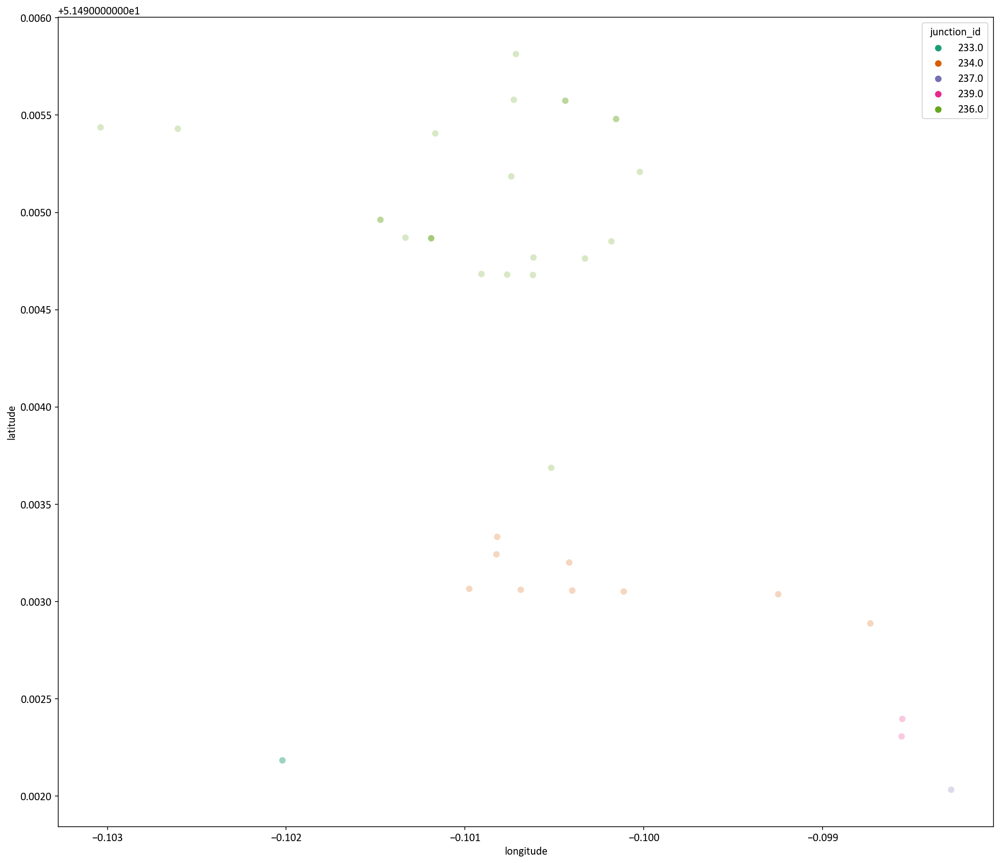

In [158]:
fig, ax = plt.subplots(figsize=(18, 16))

plt_data = p[
    (p['latitude'] >= 51.492) &
    (p['latitude'] <= 51.496) &
    (p['longitude'] >= -.105) &
    (p['longitude'] <= -.0975)
].copy()

plt_data['junction_id'] = plt_data['junction_id'].astype(str)

sns.scatterplot(
    data=plt_data,
    x='longitude',
    y='latitude',
    hue='junction_id',
    alpha=.25,
    s=50
);

# ax.set_axis_off()

In [159]:
plt_data

,id,longitude,latitude,cluster,junction_id,collision_id,size
1010,200001MM01602,-0.102021,51.492183,166,233.0,200001MM01602,3.0
1011,200101MM00188,-0.100688,51.493060,166,234.0,200101MM00188,10.0
1012,200101MM00198,-0.098281,51.492032,265,237.0,200101MM00198,3.0
1017,200201MM00300,-0.098558,51.492306,265,239.0,200201MM00300,2.0
1019,200201MM01229,-0.100112,51.493051,166,234.0,200201MM01229,10.0
1023,200501LX50554,-0.100820,51.493332,166,234.0,200501LX50554,10.0
1028,200701MM70501,-0.098554,51.492396,265,239.0,200701MM70501,2.0
1029,200801MM70354,-0.100824,51.493242,166,234.0,200801MM70354,10.0
1032,200801MM70745,-0.099248,51.493037,265,234.0,200801MM70745,10.0
1034,200801MM79168,-0.100518,51.493687,166,236.0,200801MM79168,26.0


In [128]:
point_combinations[point_combinations['source'] == '200901MM70719'].sort_values(by='dist').head(100)

,source,longitude_x,latitude_x,cluster_x,target,longitude_y,latitude_y,cluster_y,dist,weight
4401075,200901MM70719,-0.101473,51.494962,51,200601MM70397,-0.101473,51.494962,51,0.000000,inf
4401116,200901MM70719,-0.101473,51.494962,51,2016010020737,-0.101333,51.494870,51,0.000168,5969.324855
4401074,200901MM70719,-0.101473,51.494962,51,200601MM70376,-0.101189,51.494867,51,0.000299,3339.256491
4401092,200901MM70719,-0.101473,51.494962,51,200901MM70998,-0.101189,51.494867,51,0.000299,3339.256491
4401097,200901MM70719,-0.101473,51.494962,51,201101MM70340,-0.101189,51.494867,51,0.000299,3339.256491
...,...,...,...,...,...,...,...,...,...,...
4400738,200901MM70719,-0.101473,51.494962,51,2020010249908,-0.096566,51.489587,60,0.007278,137.400398
4400688,200901MM70719,-0.101473,51.494962,51,200301MM00467,-0.097106,51.489135,60,0.007282,137.328674
4400725,200901MM70719,-0.101473,51.494962,51,2018010098889,-0.096510,51.489541,60,0.007350,136.059320
4400682,200901MM70719,-0.101473,51.494962,51,200101MM01457,-0.094164,51.494034,136,0.007368,135.727991


In [127]:
junction_collisions.head().T.head(50)

,1,3,4,5,6
id,200001WW00551,200401WW00069,200601TE00267,200601WW50158,200701WW50144
accyr,2000,2004,2006,2006,2007
casualties,Cyclist,Cyclist,Cyclist,Cyclist,Cyclist
accident_year,2000,2004,2006,2006,2007
accident_reference,01WW00551,01WW00069,01TE00267,01WW50158,01WW50144
location_easting_osgr,525840,526050,525780,525870,525810
location_northing_osgr,174770,175400,174960,174650,174920
longitude,-0.190102,-0.186856,-0.190897,-0.189713,-0.19048
latitude,51.457874,51.46349,51.459595,51.456789,51.459229
police_force,Metropolitan Police,Metropolitan Police,Metropolitan Police,Metropolitan Police,Metropolitan Police
